In [1]:
import pandas as pd
import os
# import datetime
# import psycopg2
import numpy as np
import math
# import plotly.express as px
# import plotly.graph_objects as go
# import plotly.figure_factory as ff
import re
import time
import matplotlib.pyplot as plt
%matplotlib inline
# from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)
# from matplotlib import dates
# import matplotlib.gridspec as gridspec
import seaborn as sns

In [2]:
def look_at_data(fluxes, ts_col, *cols):

    global units
    
    ts_index = list(fluxes.columns).index(ts_col)
    for k in range(0, fluxes.shape[0], 2000):
        
        part = fluxes.iloc[k:k+2000, :]
        
        if type(ts_col) == str:
            if ts_col == 'index':
                time_col = part.index
            else:
                time_col = part[ts_col]    
        else: 
            time_col = part.index
         
        if part[part[cols[0]].isna()].shape[0] == part[cols[0]].shape[0]:
            
            if type(ts_col) == str and ts_col != 'index':
                print(f'no data {part.loc[part.index[-1], ts_col]} - {part.loc[part.index[0], ts_col]}')
            else:
                
                print(f'no data {part.index[-1] - part.index[0]}')
            continue
        else:
            plt.figure(figsize=(20, 4))
            
                
            for fig_col in cols:
                if part.loc[part[fig_col] == -9999, fig_col].count() > 0:
                    part.loc[part[fig_col] == -9999, fig_col] = None

                plt.plot(time_col, part[fig_col], label = fig_col)
                    
            plt.xlabel('Date')
            plt.ylabel(f'{fig_col}, {units.loc["pic", fig_col]}')
            plt.title(f'{fig_col} data from {part.iloc[0, ts_index]} to {part.iloc[-1, ts_index]}')
            plt.grid()
            plt.legend()
            plt.autoscale(enable=None, axis="x", tight=True)
            plt.show()


In [3]:
def despike(fluxes, ts, col, interval_days=20,  std=1.5):
    print('------------------')
    print(f'Despike {col}:')
    print(f'number of null values: {fluxes[col].isna().sum()}, {(fluxes[col].isna().sum() / fluxes[col].shape[0])* 100} % ')
    print(f'number of null values: {fluxes[col].notna().sum()}, {(fluxes[col].notna().sum() / fluxes[col].shape[0])*100} % ')
    ts_index = list(fluxes.columns).index(ts)
    
    daily_aver_col = f'daily_aver_{col}'
    for i in range(48):

        tss = fluxes.index[i::48]
        df = fluxes.loc[tss, [ts, col]]
        
        df[daily_aver_col] = df[col].rolling(interval_days*2+1, min_periods=1, center=True).mean()
        fluxes.loc[tss, daily_aver_col] = df[daily_aver_col]
        units[daily_aver_col] = units[col]
        
    resid_col = f'resid_{col}'
    fluxes[resid_col] = fluxes[col] - fluxes[daily_aver_col]
    units[resid_col] = units[col]
    std_col = f'{col}_std'
    for i in range(48):

        tss = sorted(list(fluxes.index[i::48]) + list(fluxes.index[i+47::48]) + list(fluxes.index[i+1::48]))
        df = fluxes.loc[tss, [ts, resid_col]]
        
        df[std_col] = df[resid_col].rolling(interval_days*4+1, min_periods=1, center=True).std()
        fluxes.loc[tss, std_col] = df[std_col]
    # fluxes[std_col] = (fluxes[resid_col]).rolling(interval_days * 48 +1, min_periods=1, center=True).std()
    units[std_col] = units[col]
    resid_max_col = f'resid_max_{col}'
    resid_min_col = f'resid_min_{col}'
    
    fluxes[resid_max_col] = std * fluxes[std_col]
    fluxes[resid_min_col] =  - std * fluxes[std_col]
    units[resid_max_col] = units[col]
    units[resid_min_col] = units[col]
    despike_col = f'{col}_2'
    units[despike_col] = units[col]
    fluxes[despike_col] = fluxes[col]
    spike_amount = fluxes[(fluxes[resid_col] > fluxes[resid_max_col]) | (fluxes[resid_col] < fluxes[resid_min_col])].shape[0]
    total = fluxes[col].notna().sum()
    print(f'Column {col} has {spike_amount} spikes ({spike_amount/total * 100}%) from total {total} records')
    
    look_at_data(fluxes, ts, resid_col, resid_max_col, resid_min_col)

    print()
    print(f'Data {col} with discarded outliers:')
    discard_mask = (fluxes[resid_col] > fluxes[resid_max_col]) | (fluxes[resid_col] < fluxes[resid_min_col])
    fluxes.loc[discard_mask, despike_col] = None
    
    look_at_data(fluxes, ts, col, daily_aver_col, despike_col)

    print('--------------------------')
    print()



In [4]:
def foo(args):

    center = (len(args))//2
    res = args[center]

    if (pd.notna(args[0])) and (pd.notna(args[-1])):
        if len(args) == 3 and pd.isna(args[1]):
            res = sum([args[0], args[-1]])/ 2
                
        if len(args) == 4:

            if pd.isna(args[1]) and pd.isna(args[2]):
                res = (args[0] + 2* args[-1]) / 3
    
    return res

def fillna_1_2_gap(df, ts_col, col):
    print('Filling the gaps with size 1-2 values by linear trend:')
    if col[-2:] == '_2':
        next_step = col[:-2] + '_3'

    else:
        next_step = col + '_3'

    df[next_step] = df[col].rolling(4, min_periods=1, center=True).apply(lambda x: foo(x), raw=True)

    df[next_step] = df[next_step].rolling(3, min_periods=1, center=True).apply(lambda x: foo(x), raw=True)
    units[next_step] = units[col]
    # look_at_data(df, ts_col, col, next_step)
    print(f'Number of values filled: {df[col].isna().sum() - df[next_step].isna().sum()}')
    print('--------------------------------')
    print()



In [5]:
def daily_aver(df, ts_col, col, interval_days):
    print('Fill the gaps with daily average trend')
    daily_aver_col = f'daily_aver_{col}_cleaned'
    for i in range(48):

        tss = df.index[i::48]
        part = df.loc[tss, [ts_col, col]]
        
        part[daily_aver_col] = part[col].rolling(interval_days*2+1, min_periods=1, center=True).mean()
        df.loc[tss, daily_aver_col] = part[daily_aver_col]
    
    if col[-2:] == '_3':
        filled_col = col[:-2] + '_f'
    df[filled_col] = df[col].fillna(df[daily_aver_col])
    
    units[daily_aver_col] = units[col]
    units[filled_col] = units[col]
    look_at_data(df, ts_col, col, daily_aver_col, filled_col)
    
    print(f'Number of filled values on this step: {df[col].isna().sum() - df[filled_col].isna().sum()}')
    print(f'Number of nan values on this step: {df[filled_col].isna().sum()}, {df[filled_col].isna().sum()/ df[col].shape[0] * 100}%')
    print('----------------------------')
    print('----------------------------')
    print()

In [6]:
def make_good_data(df, time_col):

    qc_cols = [x for x in df if 'qc_' in x]
    flux_cols = [x[3:] for x in qc_cols]

    for col in flux_cols:
        df[col + '_qual'] = df[col]
        df.loc[df['qc_' + col]==2, col + '_qual'] = None
        units[col + '_qual'] = units[col]
    
    df['NEE'] = df['co2_flux_qual'] + df['co2_strg']
    units['NEE'] = units['co2_flux']
    for col in ['NEE', 'H_qual', 'LE_qual']:
        despike(df, time_col, col, interval_days=20,  std=1.5)
        fillna_1_2_gap(df, time_col, col+'_2')
        daily_aver(df, time_col, col+'_3', 20)

In [7]:
def first_clean(df, col, n_sigma=3):
    cleaned_col = col+'_cleaned'

    #  df[col].hist(bins=200)
    col_mean =df[col].mean()
    col_std = df[col].std()

    df[cleaned_col] = df[col][(df[col] > col_mean - n_sigma* col_std) & (df[col] < col_mean + n_sigma* col_std)]
    look_at_data(df, 'ts', col, cleaned_col)
    print('Number of discarted values: ', df[col].count() - df[cleaned_col].count())


In [8]:
folder = r"D:\work_python\eddy_pro+\postprocess_fluxes\input_files"
dirs = [os.path.join(folder, f) for f in os.listdir(folder) if os.path.isdir(os.path.join(folder, f)) ]

dirs

['D:\\work_python\\eddy_pro+\\postprocess_fluxes\\input_files\\KCR_eddypro_2023-02-24--2023-06-25__4',
 'D:\\work_python\\eddy_pro+\\postprocess_fluxes\\input_files\\KCR_eddypro_2023-06-24--2023-11-15_3']

In [9]:

full_outputs = [os.path.join(path, list(filter(lambda x: '_full_output_' in x, os.listdir(path)))[0]) for path in dirs if len(list(filter(lambda x: '_full_output_' in x, os.listdir(path)))) > 0]
full_outputs

['D:\\work_python\\eddy_pro+\\postprocess_fluxes\\input_files\\KCR_eddypro_2023-02-24--2023-06-25__4\\eddypro_KCR_8__full_output_2024-01-17T013342_adv.csv',
 'D:\\work_python\\eddy_pro+\\postprocess_fluxes\\input_files\\KCR_eddypro_2023-06-24--2023-11-15_3\\eddypro_KCR_8__full_output_2024-01-16T094204_adv.csv']

In [10]:
biomets = [os.path.join(path, list(filter(lambda x:  '_biomet_' in x, os.listdir(path)))[0]) for path in dirs if len(list(filter(lambda x: '_biomet_' in x, os.listdir(path)))) > 0]
biomets

['D:\\work_python\\eddy_pro+\\postprocess_fluxes\\input_files\\KCR_eddypro_2023-02-24--2023-06-25__4\\eddypro_KCR_8__biomet_2024-01-16T122348_adv.csv',
 'D:\\work_python\\eddy_pro+\\postprocess_fluxes\\input_files\\KCR_eddypro_2023-06-24--2023-11-15_3\\eddypro_KCR_8__biomet_2024-01-15T171622_adv.csv']

In [11]:

def make_df(path):
    df = pd.read_csv(path, na_values=-9999, skiprows=[0, 2])

    print(df.shape)
    print(df.isna().sum())
    df.index = pd.to_datetime(df['date'] + ' ' + df['time'])
    beginning = df.index[0]
    ending = df.index[-1]
    print(f'start: {beginning}, end: {ending}')
    # df = df.dropna(how='all', axis=1)
    # df = df.dropna(thresh=10, axis=0)
    print(f'df size after nan drop: {df.shape}')
    print('--------------------------')
    return {'df': df, 'beginning': beginning, 'ending': ending}

In [12]:
datas = []
for path in full_outputs:
    datas.append(make_df(path))

(4080, 193)
filename                            0
date                                0
time                                0
DOY                                 0
daytime                            32
                                   ..
h2o_signal_strength_7200_mean      32
delta_signal_strength_7200_mean    32
flowrate_mean                      32
hit_power_mean                     32
hit_vin_mean                       32
Length: 193, dtype: int64
start: 2023-04-01 00:30:00, end: 2023-06-25 00:00:00
df size after nan drop: (4080, 193)
--------------------------
(3696, 193)
filename                            0
date                                0
time                                0
DOY                                 0
daytime                            13
                                   ..
h2o_signal_strength_7200_mean      13
delta_signal_strength_7200_mean    13
flowrate_mean                      13
hit_power_mean                     13
hit_vin_mean                       1

In [13]:
datas.sort(key = lambda x: x['beginning'])

beginnings = [data['beginning'] for data in datas]
endings = [data['ending'] for data in datas]
gaps = [ beginnings[i+1] - endings[i] for i in range(len(endings)-1)]
gaps

[Timedelta('-9 days +00:30:00')]

In [14]:
overlap_indexes = []
for i, gap in enumerate(gaps):
    if gap < pd.Timedelta('00:00:00'):
        print(gap, i)
        overlap_indexes.append(i)
        

-9 days +00:30:00 0


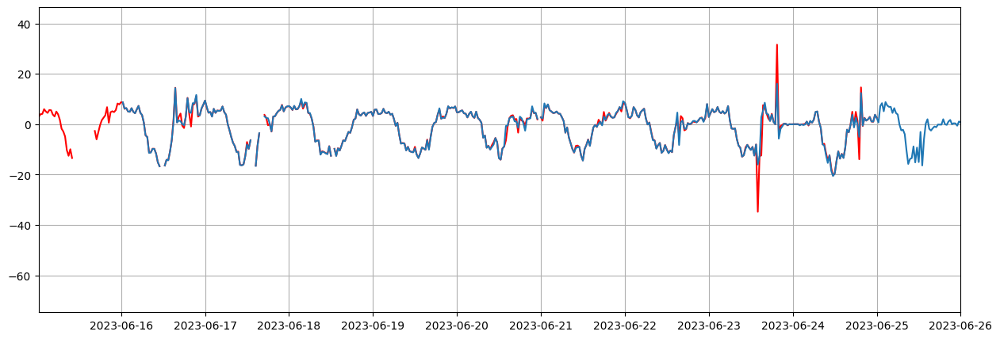

In [15]:
for over_indx in overlap_indexes:
    plt.figure(figsize=(15, 5))
    plt.plot(datas[over_indx]['df'].index, datas[over_indx]['df']['co2_flux'], 'r')
    plt.plot(datas[over_indx + 1]['df'].index, datas[over_indx + 1]['df']['co2_flux'])
    plt.xlim(beginnings[over_indx + 1]  - pd.Timedelta('1days'),  endings[over_indx] + pd.Timedelta('1days'))
    plt.grid()

In [16]:
edges = [pd.to_datetime('2023-06-16 02:00')]

In [18]:
cuts = [pd.Timedelta('0days') if i in overlap_indexes else pd.Timedelta('0days')]

edge_it = iter(edges)
concat_limits = []

beg = [beginnings[0]]
ends = []
for i in range(len(endings)-1):
    
    if i in overlap_indexes:
        q = next(edge_it)

        ends.append(q)

        beg.append(q + pd.Timedelta('30min'))

    else:
        ends.append(endings[i])
        beg.append(beginnings[i+1] )

ends.append(endings[-1])
concat_limits = list(zip(beg, ends))
concat_limits

[(Timestamp('2023-04-01 00:30:00'), Timestamp('2023-06-16 02:00:00')),
 (Timestamp('2023-06-16 02:30:00'), Timestamp('2023-09-01 00:00:00'))]

In [19]:
df = pd.concat([datas[i]['df'].loc[concat_limits[i][0]: concat_limits[i][1], :] for i in range(len(datas))])
df

,filename,date,time,DOY,daytime,file_records,used_records,Tau,qc_Tau,rand_err_Tau,...,co2_mean.1,h2o_mean.1,dew_point_mean,avg_signal_strength_7200_mean,co2_signal_strength_7200_mean,h2o_signal_strength_7200_mean,delta_signal_strength_7200_mean,flowrate_mean,hit_power_mean,hit_vin_mean
2023-04-01 00:30:00,2023-04-01T000000_KTR-AIU-2334.ghg,2023-04-01,00:30,91.020,0.0,18000.0,18000.0,-0.041252,0.0,0.007204,...,428.945,25.0719,19.1488,99.4237,99.9288,98.9186,1.010140,0.000205,3.0,23.2077
2023-04-01 01:00:00,2023-04-01T003000_KTR-AIU-2334.ghg,2023-04-01,01:00,91.041,0.0,18000.0,18000.0,-0.017399,0.0,0.004445,...,431.744,24.8772,19.0175,99.4309,99.9287,98.9331,0.995546,0.000205,3.0,23.1918
2023-04-01 01:30:00,2023-04-01T010000_KTR-AIU-2334.ghg,2023-04-01,01:30,91.062,0.0,18000.0,18000.0,-0.027701,0.0,0.007751,...,434.345,24.5234,18.7811,99.4471,99.9371,98.9571,0.980060,0.000204,3.0,23.1769
2023-04-01 02:00:00,2023-04-01T013000_KTR-AIU-2334.ghg,2023-04-01,02:00,91.083,0.0,18000.0,18000.0,-0.022992,1.0,0.002313,...,439.366,24.1600,18.5354,99.4297,99.8971,98.9624,0.934716,0.000205,3.0,23.1555
2023-04-01 02:30:00,2023-04-01T020000_KTR-AIU-2334.ghg,2023-04-01,02:30,91.104,0.0,18000.0,18000.0,-0.019456,1.0,0.002929,...,431.879,23.8475,18.3215,99.3869,99.8311,98.9428,0.888352,0.000205,3.0,23.1362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-31 22:00:00,2023-08-31T213000_KTR-AIU-2334.ghg,2023-08-31,22:00,243.917,0.0,18000.0,18000.0,-0.099609,0.0,0.007815,...,411.974,25.1514,19.1417,100.4590,101.0880,99.8294,1.258770,0.000204,-1.0,0.0000
2023-08-31 22:30:00,2023-08-31T220000_KTR-AIU-2334.ghg,2023-08-31,22:30,243.937,0.0,18000.0,18000.0,-0.030580,0.0,0.004377,...,415.302,25.1084,19.1133,100.4160,101.0290,99.8016,1.227960,0.000205,-1.0,0.0000
2023-08-31 23:00:00,2023-08-31T223000_KTR-AIU-2334.ghg,2023-08-31,23:00,243.958,0.0,18000.0,18000.0,-0.018242,0.0,0.004047,...,415.464,25.0511,19.0727,100.4270,101.0420,99.8124,1.229550,0.000204,-1.0,0.0000
2023-08-31 23:30:00,2023-08-31T230000_KTR-AIU-2334.ghg,2023-08-31,23:30,243.979,0.0,18000.0,18000.0,-0.026405,0.0,0.005588,...,416.339,25.2214,19.1772,100.3940,101.0060,99.7820,1.223550,0.000204,-1.0,0.0000


In [20]:
null_cols = []
for col in df.columns:
    if df[col].isna().sum() == df.shape[0]:
        null_cols.append(col)

null_cols


['ch4_flux',
 'qc_ch4_flux',
 'rand_err_ch4_flux',
 'none_flux',
 'qc_none_flux',
 'rand_err_none_flux',
 'ch4_strg',
 'none_strg',
 'ch4_v-adv',
 'none_v-adv',
 'ch4_molar_density',
 'ch4_mole_fraction',
 'ch4_mixing_ratio',
 'ch4_time_lag',
 'none_molar_density',
 'none_mole_fraction',
 'none_mixing_ratio',
 'none_time_lag',
 'pitch',
 'roll',
 'un_ch4_flux',
 'ch4_scf',
 'un_none_flux',
 'un_none_scf',
 'ch4_spikes',
 'none_spikes',
 'chopper_LI-7500',
 'detector_LI-7500',
 'pll_LI-7500',
 'sync_LI-7500',
 'not_ready_LI-7700',
 'no_signal_LI-7700',
 're_unlocked_LI-7700',
 'bad_temp_LI-7700',
 'laser_temp_unregulated_LI-7700',
 'block_temp_unregulated_LI-7700',
 'motor_spinning_LI-7700',
 'pump_on_LI-7700',
 'top_heater_on_LI-7700',
 'bottom_heater_on_LI-7700',
 'calibrating_LI-7700',
 'motor_failure_LI-7700',
 'bad_aux_tc1_LI-7700',
 'bad_aux_tc2_LI-7700',
 'bad_aux_tc3_LI-7700',
 'box_connected_LI-7700',
 'mean_value_LI-7500',
 'ch4_var',
 'none_var',
 'w/ch4_cov',
 'w/none_cov']

In [21]:
df.dropna(how='all', axis=1, inplace=True)
df.shape

(7344, 142)

In [22]:
list(df.columns)

['filename',
 'date',
 'time',
 'DOY',
 'daytime',
 'file_records',
 'used_records',
 'Tau',
 'qc_Tau',
 'rand_err_Tau',
 'H',
 'qc_H',
 'rand_err_H',
 'LE',
 'qc_LE',
 'rand_err_LE',
 'co2_flux',
 'qc_co2_flux',
 'rand_err_co2_flux',
 'h2o_flux',
 'qc_h2o_flux',
 'rand_err_h2o_flux',
 'H_strg',
 'LE_strg',
 'co2_strg',
 'h2o_strg',
 'co2_v-adv',
 'h2o_v-adv',
 'co2_molar_density',
 'co2_mole_fraction',
 'co2_mixing_ratio',
 'co2_time_lag',
 'co2_def_timelag',
 'h2o_molar_density',
 'h2o_mole_fraction',
 'h2o_mixing_ratio',
 'h2o_time_lag',
 'h2o_def_timelag',
 'ch4_def_timelag',
 'none_def_timelag',
 'sonic_temperature',
 'air_temperature',
 'air_pressure',
 'air_density',
 'air_heat_capacity',
 'air_molar_volume',
 'ET',
 'water_vapor_density',
 'e',
 'es',
 'specific_humidity',
 'RH',
 'VPD',
 'Tdew',
 'u_unrot',
 'v_unrot',
 'w_unrot',
 'u_rot',
 'v_rot',
 'w_rot',
 'wind_speed',
 'max_wind_speed',
 'wind_dir',
 'yaw',
 'u*',
 'TKE',
 'L',
 '(z-d)/L',
 'bowen_ratio',
 'T*',
 'model

In [23]:
df_units = pd.read_csv(full_outputs[0], skiprows=1, nrows=1)
df_units


,filename,date,time,DOY,daytime,file_records,used_records,Tau,qc_Tau,rand_err_Tau,...,co2_mean.1,h2o_mean.1,dew_point_mean,avg_signal_strength_7200_mean,co2_signal_strength_7200_mean,h2o_signal_strength_7200_mean,delta_signal_strength_7200_mean,flowrate_mean,hit_power_mean,hit_vin_mean
0,NaN,[yyyy-mm-dd],[HH:MM],[ddd.ddd],[1=daytime],[#],[#],[kg+1m-1s-2],[#],[kg+1m-1s-2],...,--,--,--,--,--,--,--,--,--,--


In [24]:
df_units.drop(null_cols, axis=1, inplace=True)
df_units.shape

(1, 142)

In [25]:
# df.to_csv('KCR_eddypro_data2.csv')

In [26]:

def make_bio(path):
    df = pd.read_csv(path, na_values=-9999, skiprows=[1])

    print(df.shape)
    print(df.isna().sum())
    df.index = pd.to_datetime(df['date'] + ' ' + df['time'])
    beginning = df.index[0]
    ending = df.index[-1]
    print(f'start: {beginning}, end: {ending}')
    # df = df.dropna(how='all', axis=1)
    # df = df.dropna(thresh=10, axis=0)
    print(f'df size after nan drop: {df.shape}')
    print('--------------------------')
    return {'df': df, 'beginning': beginning, 'ending': ending}

In [27]:
bios = []
for path in biomets:
    bios.append(make_bio(path))

(4081, 26)
date              0
time              0
DOY               0
CHK__1_1_1       13
DAQM_T_1_1_1     13
VIN_1_1_1        13
PPFD_1_1_1       13
P_RAIN_1_1_1     13
RG_1_1_1         13
RH_1_1_1         13
RH_2_1_1         13
RN_1_1_1         13
SHFSENS_1_1_1    13
SHFSENS_2_1_1    13
SHFSENS_3_1_1    13
SHF_1_1_1        13
SHF_2_1_1        13
SHF_3_1_1        13
SWC_1_1_1        13
SWC_2_1_1        13
SWC_3_1_1        13
TA_1_1_1         13
TA_2_1_1         13
TS_1_1_1         13
TS_2_1_1         13
TS_3_1_1         13
dtype: int64
start: 2023-04-01 00:00:00, end: 2023-06-25 00:00:00
df size after nan drop: (4081, 26)
--------------------------
(3695, 26)
date             0
time             0
DOY              0
CHK__1_1_1       4
DAQM_T_1_1_1     4
VIN_1_1_1        4
PPFD_1_1_1       4
P_RAIN_1_1_1     4
RG_1_1_1         4
RH_1_1_1         4
RH_2_1_1         4
RN_1_1_1         4
SHFSENS_1_1_1    4
SHFSENS_2_1_1    4
SHFSENS_3_1_1    4
SHF_1_1_1        4
SHF_2_1_1        4
SHF_3_1

In [28]:
bio  = pd.concat([bios[i]['df'].loc[concat_limits[i][0]: concat_limits[i][1], :] for i in range(len(biomets))])
bio

,date,time,DOY,CHK__1_1_1,DAQM_T_1_1_1,VIN_1_1_1,PPFD_1_1_1,P_RAIN_1_1_1,RG_1_1_1,RH_1_1_1,...,SHF_2_1_1,SHF_3_1_1,SWC_1_1_1,SWC_2_1_1,SWC_3_1_1,TA_1_1_1,TA_2_1_1,TS_1_1_1,TS_2_1_1,TS_3_1_1
2023-04-01 00:30:00,2023-04-01,00:30,91.0208,120.900,26.6325,12.2604,-0.037442,0.0000,-0.000286,99.9604,...,2.526720,3.526830,0.200233,0.163000,0.212000,294.139,293.869,295.750,294.450,294.443
2023-04-01 01:00:00,2023-04-01,01:00,91.0416,100.333,26.5685,12.2687,-0.043516,0.0000,-0.000399,99.8958,...,2.306750,3.192390,0.200233,0.163000,0.212000,294.066,293.724,295.750,294.450,294.390
2023-04-01 01:30:00,2023-04-01,01:30,91.0624,132.533,26.4550,12.2687,-0.045534,0.0000,-0.000520,99.7656,...,2.076330,2.781720,0.200333,0.163000,0.212000,293.875,293.474,295.630,294.350,294.297
2023-04-01 02:00:00,2023-04-01,02:00,91.0833,110.867,26.3039,12.2688,-0.045963,0.0000,-0.000553,99.3067,...,1.935250,2.568150,0.200233,0.163000,0.212000,293.593,293.256,295.550,294.297,294.270
2023-04-01 02:30:00,2023-04-01,02:30,91.1041,126.733,26.0102,12.2686,-0.046544,0.0000,-0.000558,99.5132,...,1.791370,2.371530,0.200133,0.163000,0.211967,293.149,293.114,295.550,294.250,294.250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-31 21:30:00,2023-08-31,21:30,243.8956,143.500,26.3987,12.2675,-0.009524,0.0002,-0.000740,100.3690,...,-0.447779,-0.575153,0.368633,0.294400,0.348533,294.391,294.251,295.950,295.750,295.750
2023-08-31 22:00:00,2023-08-31,22:00,243.9165,102.267,26.2568,12.2675,-0.010736,0.0004,-0.000475,100.3790,...,-0.765680,-0.810915,0.372800,0.280467,0.342133,294.322,294.516,295.950,295.750,295.750
2023-08-31 22:30:00,2023-08-31,22:30,243.9373,143.433,26.1073,12.2673,-0.011156,0.0003,-0.000571,100.4060,...,-0.999794,-1.093550,0.389933,0.292167,0.343600,294.230,294.224,295.943,295.750,295.737
2023-08-31 23:00:00,2023-08-31,23:00,243.9581,137.900,25.9732,12.2672,-0.011222,0.0002,-0.000138,100.4060,...,-1.179170,-1.271600,0.404733,0.291033,0.342867,294.078,294.164,295.890,295.730,295.697


In [29]:
list(bio.columns)

['date',
 'time',
 'DOY',
 'CHK__1_1_1',
 'DAQM_T_1_1_1',
 'VIN_1_1_1',
 'PPFD_1_1_1',
 'P_RAIN_1_1_1',
 'RG_1_1_1',
 'RH_1_1_1',
 'RH_2_1_1',
 'RN_1_1_1',
 'SHFSENS_1_1_1',
 'SHFSENS_2_1_1',
 'SHFSENS_3_1_1',
 'SHF_1_1_1',
 'SHF_2_1_1',
 'SHF_3_1_1',
 'SWC_1_1_1',
 'SWC_2_1_1',
 'SWC_3_1_1',
 'TA_1_1_1',
 'TA_2_1_1',
 'TS_1_1_1',
 'TS_2_1_1',
 'TS_3_1_1']

In [30]:
bio_units = pd.read_csv(biomets[0], nrows=1)
bio_units

,date,time,DOY,CHK__1_1_1,DAQM_T_1_1_1,VIN_1_1_1,PPFD_1_1_1,P_RAIN_1_1_1,RG_1_1_1,RH_1_1_1,...,SHF_2_1_1,SHF_3_1_1,SWC_1_1_1,SWC_2_1_1,SWC_3_1_1,TA_1_1_1,TA_2_1_1,TS_1_1_1,TS_2_1_1,TS_3_1_1
0,[yyyy-mm-dd],[HH:MM],[ddd.ddd],[OTHER],[C],[V],[µmol/m^2/s],[m],[W/m^2],[%],...,[W/m^2],[W/m^2],[m^3/m^3],[m^3/m^3],[m^3/m^3],[K],[K],[K],[K],[K]


In [31]:
units = pd.concat([df_units, bio_units.iloc[:, 3:]], axis=1)
units

,filename,date,time,DOY,daytime,file_records,used_records,Tau,qc_Tau,rand_err_Tau,...,SHF_2_1_1,SHF_3_1_1,SWC_1_1_1,SWC_2_1_1,SWC_3_1_1,TA_1_1_1,TA_2_1_1,TS_1_1_1,TS_2_1_1,TS_3_1_1
0,NaN,[yyyy-mm-dd],[HH:MM],[ddd.ddd],[1=daytime],[#],[#],[kg+1m-1s-2],[#],[kg+1m-1s-2],...,[W/m^2],[W/m^2],[m^3/m^3],[m^3/m^3],[m^3/m^3],[K],[K],[K],[K],[K]


### format units for figures labels

In [32]:

for col in units.columns[1:]:
    units.loc[2, col] = re.findall('\[(.+)\]', units.loc[0, col])[0] if '[' in units.loc[0, col] else units.loc[0, col]
    print(units.loc[2, col])


yyyy-mm-dd
HH:MM
ddd.ddd
1=daytime
#
#
kg+1m-1s-2
#
kg+1m-1s-2
W+1m-2
#
W+1m-2
W+1m-2
#
W+1m-2
µmol+1s-1m-2
#
µmol+1s-1m-2
mmol+1s-1m-2
#
mmol+1s-1m-2
W+1m-2
W+1m-2
µmol+1s-1m-2
mmol+1s-1m-2
µmol+1s-1m-2
mmol+1s-1m-2
mmol+1m-3
µmol+1mol_a-1
µmol+1mol_d-1
s
1=default
mmol+1m-3
mmol+1mol_a-1
mmol+1mol_d-1
s
1=default
1=default
1=default
K
K
Pa
kg+1m-3
J+1kg-1K-1
m+3mol-1
mm+1hour-1
kg+1m-3
Pa
Pa
kg+1kg-1
%
Pa
K
m+1s-1
m+1s-1
m+1s-1
m+1s-1
m+1s-1
m+1s-1
m+1s-1
m+1s-1
deg_from_north
deg
m+1s-1
m+2s-2
m
#
#
K
0=KJ/1=KM/2=HS
m
m
m
m
m
m
m
kg+1m-1s-2
#
W+1m-2
#
W+1m-2
#
µmol+1s-1m-2
#
mmol+1s-1m-2
#
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8co2/h2o/ch4/none
8co2/h2o/ch4/none
8aa
8U
#
#
#
#
#
#
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged

<>:2: SyntaxWarning: invalid escape sequence '\['
<>:2: SyntaxWarning: invalid escape sequence '\['
C:\Users\Natalya\AppData\Local\Temp\ipykernel_708\3247780078.py:2: SyntaxWarning: invalid escape sequence '\['
  units.loc[2, col] = re.findall('\[(.+)\]', units.loc[0, col])[0] if '[' in units.loc[0, col] else units.loc[0, col]


In [126]:
mu = '\u03BC'
degree = '\u00B0'

def edit_units_for_pic(unit):
    edit = {'umol': f'{mu}mol', 'm^3':'$m^3$', 'm^2': '$m^2$', 'm-3' : '/ $m^3$', 'm+3': ' $m^3$', 'm+2': ' $m^2$','m-2': '/ $m^2$',   's-1': '/ s', 'degC': f'{degree}C',  'm-1': '/ m', 's-2' : '/ $s^2$', '+1': ' ', 'kg-1': '/ kg', 'K-1': '/ K', 'mol-1' : '/ mol'} 
    for part in edit:
        unit = unit.replace(part, edit[part])
    return unit
def edit_units_mon_for_pic(unit):
    edit = {'umol': f'{mu}mol', 'W': 'W', 'm-2': '/ $m^2$', 'm-3' : '$/ m^3$', 's-1': '$/ month$', 'degC': f'{degree}C'}
    for part in edit:
        unit = unit.replace(part, edit[part])
    return unit

In [127]:
for col in units.columns[1:]:
    units.loc['pic', col] = edit_units_for_pic(units.loc[2, col])
    print(units.loc['pic', col])


yyyy-mm-dd
HH:MM
ddd.ddd
1=daytime
#
#
kg / m/ $s^2$
#
kg / m/ $s^2$
W / $m^2$
#
W / $m^2$
W / $m^2$
#
W / $m^2$
µmol / s/ $m^2$
#
µmol / s/ $m^2$
mmol / s/ $m^2$
#
mmol / s/ $m^2$
W / $m^2$
W / $m^2$
µmol / s/ $m^2$
mmol / s/ $m^2$
µmol / s/ $m^2$
mmol / s/ $m^2$
mmol / $m^3$
µmol mol_a-1
µmol mol_d-1
s
1=default
mmol / $m^3$
mmol mol_a-1
mmol mol_d-1
s
1=default
1=default
1=default
K
K
Pa
kg / $m^3$
J / kg/ K
 $m^3$/ mol
mm hour-1
kg / $m^3$
Pa
Pa
kg / kg
%
Pa
K
m / s
m / s
m / s
m / s
m / s
m / s
m / s
m / s
deg_from_north
deg
m / s
 $m^2$/ $s^2$
m
#
#
K
0=KJ/1=KM/2=HS
m
m
m
m
m
m
m
kg / m/ $s^2$
#
W / $m^2$
#
W / $m^2$
#
µmol / s/ $m^2$
#
mmol / s/ $m^2$
#
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8u/v/w/ts/co2/h2o/ch4/none
8co2/h2o/ch4/none
8co2/h2o/ch4/none
8aa
8U
#
#
#
#
#
#
#_flagged_recs
#_flagged_recs
#_flagged_recs
#_flagged_recs


In [128]:
units

,filename,date,time,DOY,daytime,file_records,used_records,Tau,qc_Tau,rand_err_Tau,...,SHF_2_1_1,SHF_3_1_1,SWC_1_1_1,SWC_2_1_1,SWC_3_1_1,TA_1_1_1,TA_2_1_1,TS_1_1_1,TS_2_1_1,TS_3_1_1
0,NaN,[yyyy-mm-dd],[HH:MM],[ddd.ddd],[1=daytime],[#],[#],[kg+1m-1s-2],[#],[kg+1m-1s-2],...,[W/m^2],[W/m^2],[m^3/m^3],[m^3/m^3],[m^3/m^3],[K],[K],[K],[K],[K]
2,NaN,yyyy-mm-dd,HH:MM,ddd.ddd,1=daytime,#,#,kg+1m-1s-2,#,kg+1m-1s-2,...,W/m^2,W/m^2,m^3/m^3,m^3/m^3,m^3/m^3,K,K,K,K,K
pic,NaN,yyyy-mm-dd,HH:MM,ddd.ddd,1=daytime,#,#,kg / m/ $s^2$,#,kg / m/ $s^2$,...,W/$m^2$,W/$m^2$,$m^3$/$m^3$,$m^3$/$m^3$,$m^3$/$m^3$,K,K,K,K,K


In [129]:
ts_cols = [x for x in bio.columns  if 'TS_' in x]
ts_cols


['TS_1_1_1', 'TS_2_1_1', 'TS_3_1_1']

In [130]:
bio['TS'] = bio[ts_cols].mean(axis=1)
units['TS'] = units[ts_cols[0]]


bio[ts_cols + ['TS']].isna().sum()


TS_1_1_1    13
TS_2_1_1    13
TS_3_1_1    13
TS          13
dtype: int64

In [131]:
bio[ts_cols + ['TS']].info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 7343 entries, 2023-04-01 00:30:00 to 2023-08-31 23:30:00
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   TS_1_1_1  7330 non-null   float64
 1   TS_2_1_1  7330 non-null   float64
 2   TS_3_1_1  7330 non-null   float64
 3   TS        7330 non-null   float64
dtypes: float64(4)
memory usage: 286.8 KB


<Axes: >

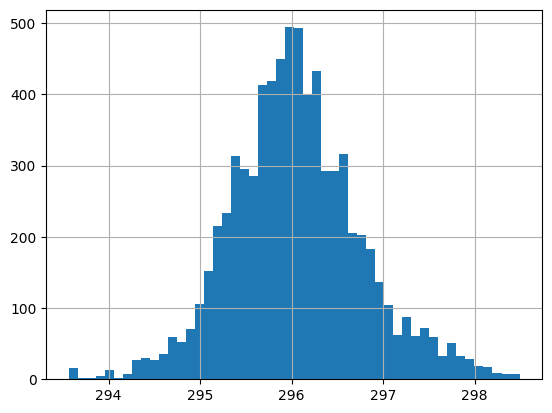

In [132]:
bio['TS'].hist(bins=50)


In [133]:

ta_cols = [x for x in bio.columns if 'TA_' in x]
rh_cols = [x for x in bio.columns if 'RH_' in x]
bio[ta_cols + rh_cols].tail(20)


,TA_1_1_1,TA_2_1_1,RH_1_1_1,RH_2_1_1
2023-08-31 14:00:00,296.151,296.220,91.7277,85.3666
2023-08-31 14:30:00,296.104,296.406,92.8253,83.8600
2023-08-31 15:00:00,296.167,296.421,91.6435,83.4582
2023-08-31 15:30:00,296.318,296.634,93.2373,83.7329
2023-08-31 16:00:00,296.284,296.550,93.5631,84.2042
2023-08-31 16:30:00,296.302,296.683,93.4826,83.4674
2023-08-31 17:00:00,296.511,296.943,95.0654,83.4906
2023-08-31 17:30:00,296.325,296.726,94.7281,83.5181
2023-08-31 18:00:00,295.924,296.126,96.2753,88.5598
2023-08-31 18:30:00,295.611,295.722,96.8472,90.5879


In [134]:

# bio_reddy_cols = ['SWIN_1_1_1', 'TA_2_1_1', 'TS', 'RH_2_1_1']
if 'KCR'.lower() in folder.lower():
    upper_ta_suff = '_2_1_1' 
if 'Bidup'.lower() in folder.lower() or 'Bdp'.lower() in folder.lower():
    upper_ta_suff = '_1_1_1_36' 
    

upper_ta = [x for x in bio.columns if (upper_ta_suff in x) and ('ta' in x.lower())][0]
upper_ta


'TA_2_1_1'

In [135]:
upper_rh = [x for x in bio.columns if (upper_ta_suff in x) and ('rh' in x.lower())][0]
take_from_bio = [upper_ta] + [upper_rh] + ['TS']
rg_cols = [x for x in bio.columns if (('rg_' in x.lower()) or ('swin_' in x.lower()) )]
rg_col = rg_cols[0]
rg_col


'RG_1_1_1'

In [136]:
take_from_bio.append(rg_col)
take_from_bio

['TA_2_1_1', 'RH_2_1_1', 'TS', 'RG_1_1_1']

In [137]:
units[rg_col]

0      [W/m^2]
2        W/m^2
pic    W/$m^2$
Name: RG_1_1_1, dtype: object

------------------------------

# add daytime column


In [138]:
sunstate = pd.read_csv(r"D:\data_process\KCR_sunrise_sunset.csv", sep=';', skiprows=1, usecols=[0, 1,3], names=['date', 'sunrise', 'sunset'],)
sunstate

,date,sunrise,sunset
0,1.05,05:24,18:03
1,2.05,05:24,18:03
2,3.05,05:23,18:04
3,4.05,05:23,18:04
4,5.05,05:23,18:04
...,...,...,...
561,12.11,05:46,17:16
562,13.11,05:46,17:15
563,14.11,05:47,17:15
564,15.11,05:47,17:15


In [139]:
year_markers = sunstate['date'][sunstate['date'] > 2021]

In [140]:
year_markers.index[0]

245

In [141]:
i0 = sunstate.index[0]
year0 = year_markers[year_markers.index[0]]-1
for ind in year_markers.index:
    print(ind, year_markers[ind])
    
    sunstate.loc[i0:(ind-1), 'date'] = pd.to_datetime ({'year':year0, 'day' : (sunstate.loc[i0:(ind-1), 'date'].apply(lambda x: math.modf(x)[1])).round(), 'month' : (sunstate.loc[i0:(ind-1), 'date'].apply(lambda x: math.modf(x)[0]*100)).round()}, format='')
    i0 = ind + 1
    year0 = year_markers[ind]
    sunstate = sunstate[sunstate.index != ind]
sunstate.loc[i0:, 'date'] = pd.to_datetime({'year':year0, 'day' : (sunstate.loc[i0:, 'date'].apply(lambda x: math.modf(x)[1])).round(), 'month' : (sunstate.loc[i0:, 'date'].apply(lambda x: math.modf(x)[0]*100)).round()}, format='')

245 2023.0


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3352735143.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '<DatetimeArray>
['2022-05-01 00:00:00', '2022-05-02 00:00:00', '2022-05-03 00:00:00',
 '2022-05-04 00:00:00', '2022-05-05 00:00:00', '2022-05-06 00:00:00',
 '2022-05-07 00:00:00', '2022-05-08 00:00:00', '2022-05-09 00:00:00',
 '2022-05-10 00:00:00',
 ...
 '2022-12-22 00:00:00', '2022-12-23 00:00:00', '2022-12-24 00:00:00',
 '2022-12-25 00:00:00', '2022-12-26 00:00:00', '2022-12-27 00:00:00',
 '2022-12-28 00:00:00', '2022-12-29 00:00:00', '2022-12-30 00:00:00',
 '2022-12-31 00:00:00']
Length: 245, dtype: datetime64[ns]' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  sunstate.loc[i0:(ind-1), 'date'] = pd.to_datetime ({'year':year0, 'day' : (sunstate.loc[i0:(ind-1), 'date'].apply(lambda x: math.modf(x)[1])).round(), 'month' : (sunstate.loc[i0:(ind-1),

In [142]:
sunstate

,date,sunrise,sunset
0,2022-05-01 00:00:00,05:24,18:03
1,2022-05-02 00:00:00,05:24,18:03
2,2022-05-03 00:00:00,05:23,18:04
3,2022-05-04 00:00:00,05:23,18:04
4,2022-05-05 00:00:00,05:23,18:04
...,...,...,...
561,2023-11-12 00:00:00,05:46,17:16
562,2023-11-13 00:00:00,05:46,17:15
563,2023-11-14 00:00:00,05:47,17:15
564,2023-11-15 00:00:00,05:47,17:15


In [143]:
sunstate['sunrise_h'] = sunstate['sunrise'].str[:2].astype(int)
sunstate['sunrise_m'] = sunstate['sunrise'].str[3:].astype(int)

sunstate['sunset_h'] = sunstate['sunset'].str[:2].astype(int)
sunstate['sunset_m'] = sunstate['sunset'].str[3:].astype(int)
sunstate['date'] = pd.to_datetime(sunstate['date']).dt.date
sunstate.reset_index(drop=True, inplace=True)

sunstate

C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\2725422473.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sunstate['sunrise_h'] = sunstate['sunrise'].str[:2].astype(int)
C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\2725422473.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sunstate['sunrise_m'] = sunstate['sunrise'].str[3:].astype(int)
C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\2725422473.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Data

,date,sunrise,sunset,sunrise_h,sunrise_m,sunset_h,sunset_m
0,2022-05-01,05:24,18:03,5,24,18,3
1,2022-05-02,05:24,18:03,5,24,18,3
2,2022-05-03,05:23,18:04,5,23,18,4
3,2022-05-04,05:23,18:04,5,23,18,4
4,2022-05-05,05:23,18:04,5,23,18,4
...,...,...,...,...,...,...,...
560,2023-11-12,05:46,17:16,5,46,17,16
561,2023-11-13,05:46,17:15,5,46,17,15
562,2023-11-14,05:47,17:15,5,47,17,15
563,2023-11-15,05:47,17:15,5,47,17,15


In [144]:
sunstate['date'].isna().sum()

0

In [145]:
def set_daytime(ts):
    day = sunstate[sunstate['date'] == ts.date()]
    sunrise = day.iloc[0, 0] + pd.DateOffset(hour=day.iloc[0, 3], minute=day.iloc[0,4])
    sunset = day.iloc[0, 0] + pd.DateOffset(hour=day.iloc[0, 5], minute=day.iloc[0,6])
    if sunrise + pd.DateOffset(minutes=15) <= ts <= sunset+ pd.DateOffset(minutes=15):
        return 1
    else:
        return 0

-------------------------------------

# полный временной ряд

In [146]:
all_dates = pd.date_range(df.index[0], df.index[-1], freq = pd.Timedelta('30min'))
all_dates = pd.DataFrame(all_dates, index=all_dates)
all_dates

,0
2023-04-01 00:30:00,2023-04-01 00:30:00
2023-04-01 01:00:00,2023-04-01 01:00:00
2023-04-01 01:30:00,2023-04-01 01:30:00
2023-04-01 02:00:00,2023-04-01 02:00:00
2023-04-01 02:30:00,2023-04-01 02:30:00
...,...
2023-08-31 22:00:00,2023-08-31 22:00:00
2023-08-31 22:30:00,2023-08-31 22:30:00
2023-08-31 23:00:00,2023-08-31 23:00:00
2023-08-31 23:30:00,2023-08-31 23:30:00


In [147]:
all_dates.shape, df.shape

((7344, 1), (7344, 142))

In [148]:
all_df = all_dates.merge(df, how='left', left_on=all_dates.index, right_on = df.index)
all_df.index = all_df[0]
all_df = all_df.drop(['key_0', 0], axis=1)
all_df = all_df.merge(bio.iloc[:, 3:], how='left', left_on=all_df.index, right_on = bio.index)
all_df.index = all_df['key_0']
all_df.index.name = 'timestamp'
all_df['daytime2'] = all_df['key_0'].apply(set_daytime)
all_df['period'] = all_df.index.to_period('d').astype(str)

all_df.head(20)

,key_0,filename,date,time,DOY,daytime,file_records,used_records,Tau,qc_Tau,...,SWC_2_1_1,SWC_3_1_1,TA_1_1_1,TA_2_1_1,TS_1_1_1,TS_2_1_1,TS_3_1_1,TS,daytime2,period
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-04-01 00:30:00,2023-04-01 00:30:00,2023-04-01T000000_KTR-AIU-2334.ghg,2023-04-01,00:30,91.020,0.0,18000.0,18000.0,-0.041252,0.0,...,0.163000,0.212000,294.139,293.869,295.750,294.450,294.443,294.881000,0,2023-04-01
2023-04-01 01:00:00,2023-04-01 01:00:00,2023-04-01T003000_KTR-AIU-2334.ghg,2023-04-01,01:00,91.041,0.0,18000.0,18000.0,-0.017399,0.0,...,0.163000,0.212000,294.066,293.724,295.750,294.450,294.390,294.863333,0,2023-04-01
2023-04-01 01:30:00,2023-04-01 01:30:00,2023-04-01T010000_KTR-AIU-2334.ghg,2023-04-01,01:30,91.062,0.0,18000.0,18000.0,-0.027701,0.0,...,0.163000,0.212000,293.875,293.474,295.630,294.350,294.297,294.759000,0,2023-04-01
2023-04-01 02:00:00,2023-04-01 02:00:00,2023-04-01T013000_KTR-AIU-2334.ghg,2023-04-01,02:00,91.083,0.0,18000.0,18000.0,-0.022992,1.0,...,0.163000,0.212000,293.593,293.256,295.550,294.297,294.270,294.705667,0,2023-04-01
2023-04-01 02:30:00,2023-04-01 02:30:00,2023-04-01T020000_KTR-AIU-2334.ghg,2023-04-01,02:30,91.104,0.0,18000.0,18000.0,-0.019456,1.0,...,0.163000,0.211967,293.149,293.114,295.550,294.250,294.250,294.683333,0,2023-04-01
2023-04-01 03:00:00,2023-04-01 03:00:00,2023-04-01T023000_KTR-AIU-2334.ghg,2023-04-01,03:00,91.125,0.0,18000.0,18000.0,-0.005511,0.0,...,0.163000,0.212000,292.776,293.131,295.550,294.250,294.250,294.683333,0,2023-04-01
2023-04-01 03:30:00,2023-04-01 03:30:00,2023-04-01T030000_KTR-AIU-2334.ghg,2023-04-01,03:30,91.145,0.0,18000.0,18000.0,-0.033460,1.0,...,0.163000,0.211967,292.547,294.429,295.330,294.250,294.250,294.610000,0,2023-04-01
2023-04-01 04:00:00,2023-04-01 04:00:00,2023-04-01T033000_KTR-AIU-2334.ghg,2023-04-01,04:00,91.166,0.0,18000.0,18000.0,-0.005678,1.0,...,0.163000,0.212000,292.214,294.604,295.250,294.250,294.250,294.583333,0,2023-04-01
2023-04-01 04:30:00,2023-04-01 04:30:00,2023-04-01T040000_KTR-AIU-2334.ghg,2023-04-01,04:30,91.187,0.0,18000.0,18000.0,-0.007484,0.0,...,0.163000,0.211967,292.131,294.650,295.103,294.250,294.250,294.534333,0,2023-04-01


In [149]:
my_days =pd.pivot_table(all_df, columns=all_df['period'], index=all_df.index.time, values='daytime2')

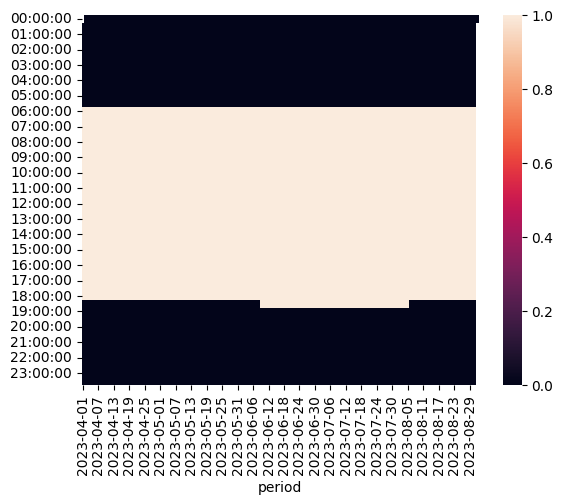

In [150]:
sns.heatmap(my_days);

In [151]:
my_days_0 =pd.pivot_table(all_df, columns=all_df['period'], index=all_df.index.time, values='daytime')

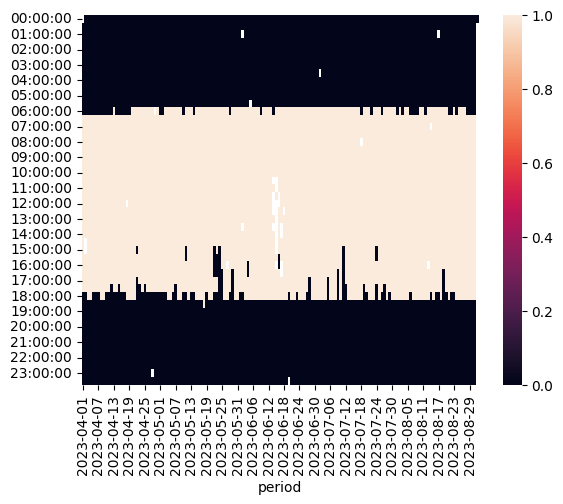

In [152]:
sns.heatmap(my_days_0);

---

# посмотрим потоки


------------------
Despike NEE:
number of null values: 632, 8.60566448801743 % 
number of null values: 6712, 91.39433551198258 % 
Column NEE has 729 spikes (10.8611442193087%) from total 6712 records


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:52: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} residuals from {part[ts][0]} to {part[ts][-1]}')


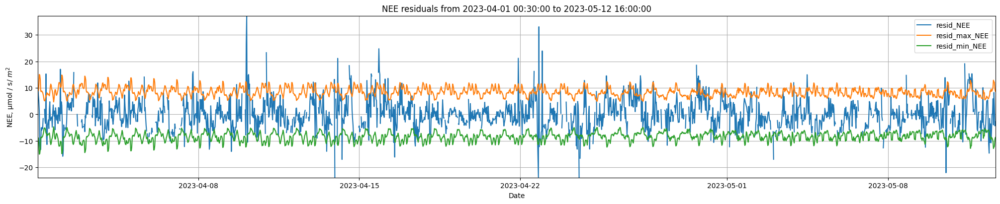

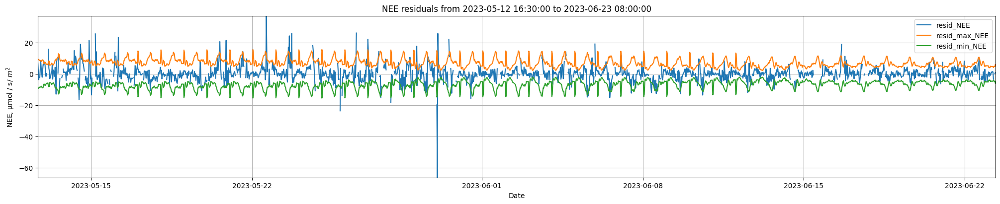

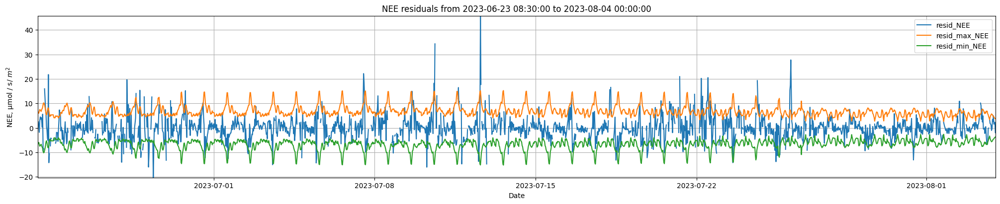

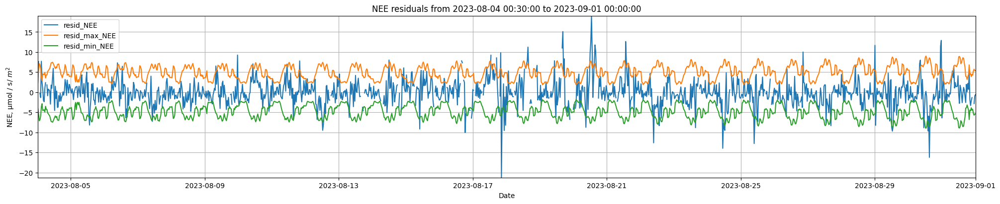


Data NEE with discarded outliers:


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} data from {part[ts][0]} to {part[ts][-1]}')


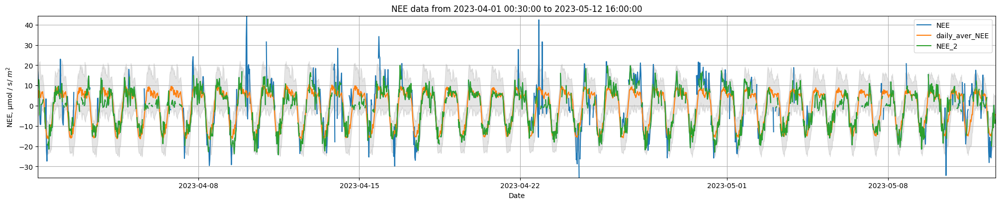

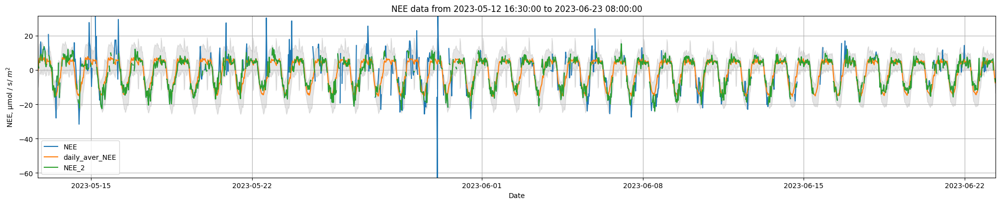

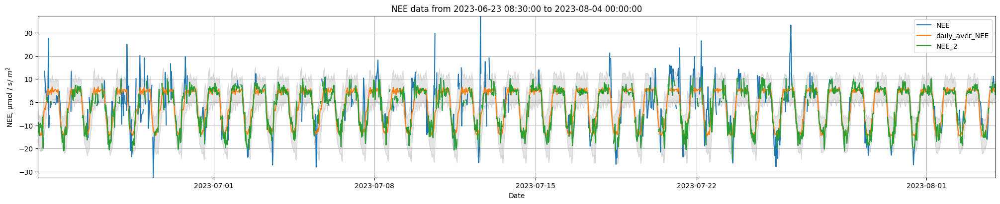

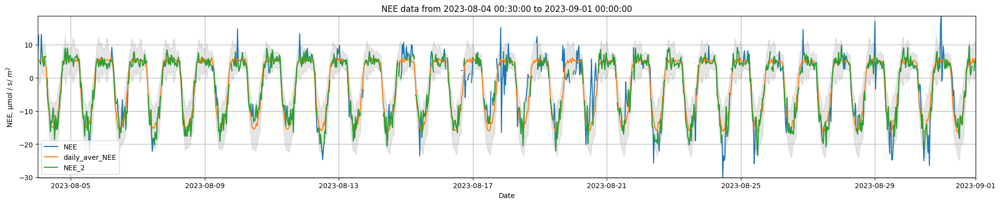

--------------------------

Filling the gaps with size 1-2 values by linear trend:
Number of values filled: 850
--------------------------------

Fill the gaps with daily average trend


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\369506106.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{fig_col} data from {part[ts_col][0]} to {part[ts_col][-1]}')


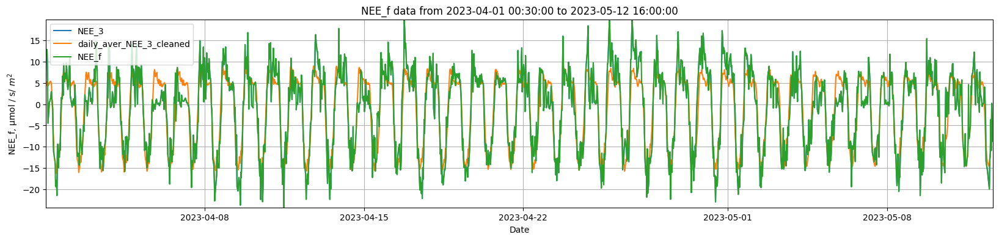

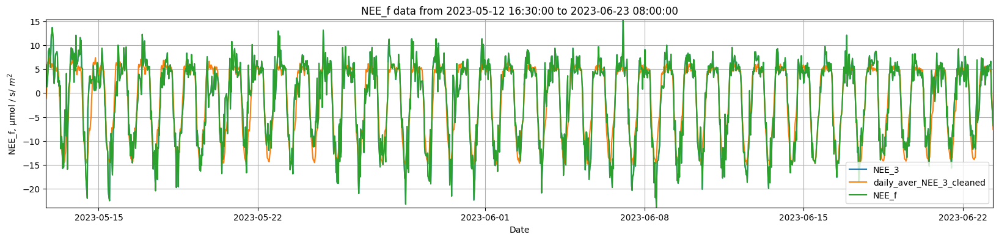

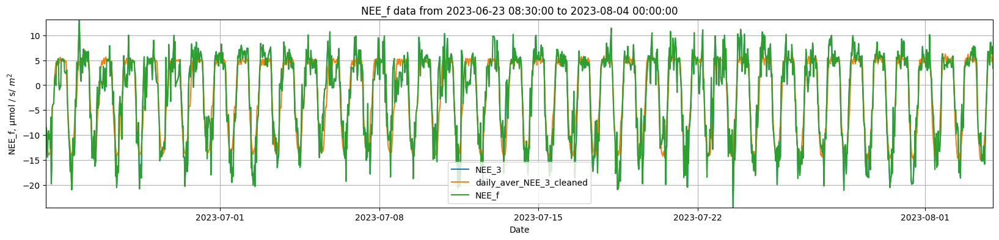

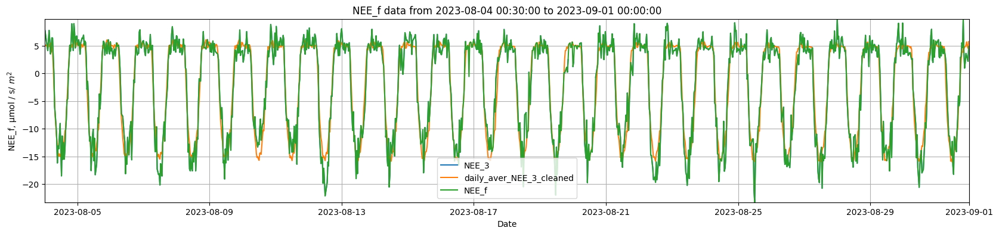

Number of filled values on this step: 511
Number of nan values on this step: 0, 0.0%
----------------------------
----------------------------

------------------
Despike H_qual:
number of null values: 735, 10.008169934640524 % 
number of null values: 6609, 89.99183006535948 % 
Column H_qual has 643 spikes (9.729157209865335%) from total 6609 records


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:52: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} residuals from {part[ts][0]} to {part[ts][-1]}')


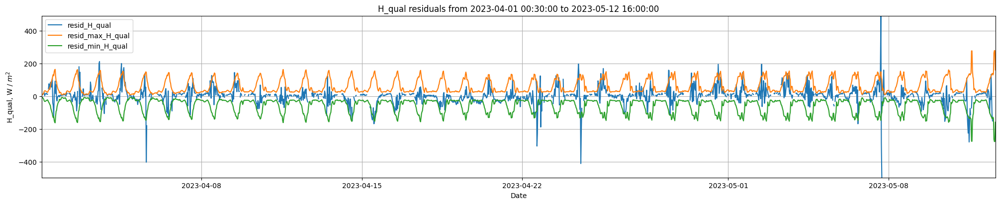

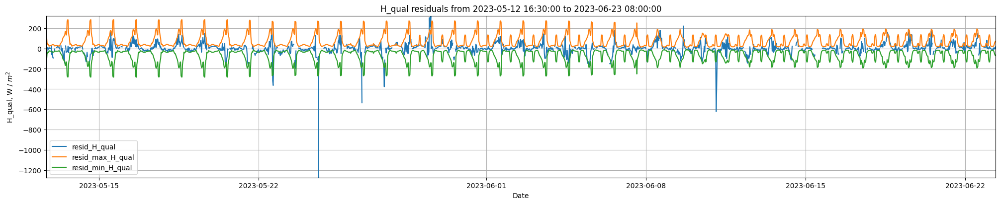

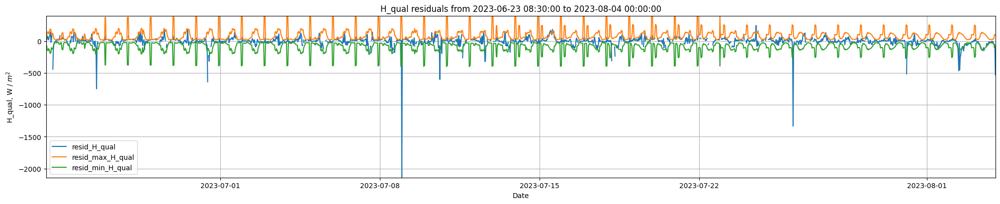

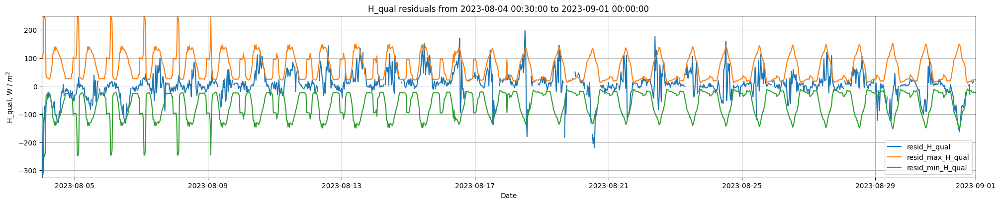


Data H_qual with discarded outliers:


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} data from {part[ts][0]} to {part[ts][-1]}')


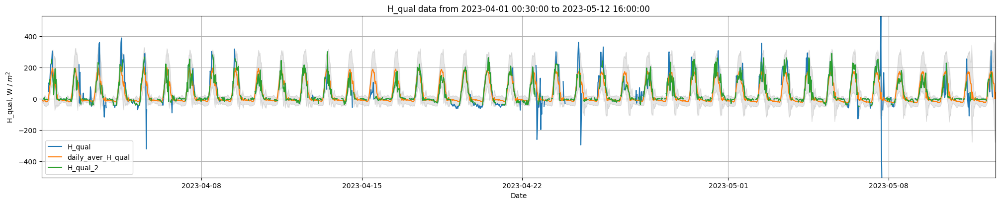

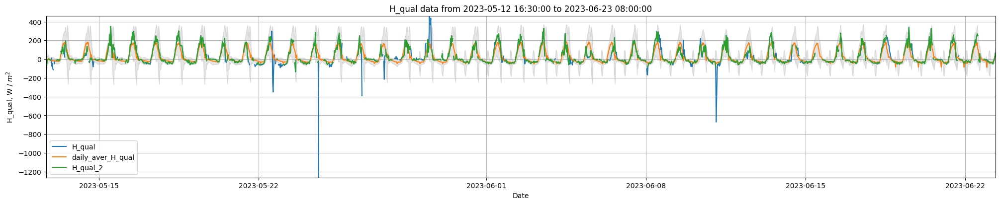

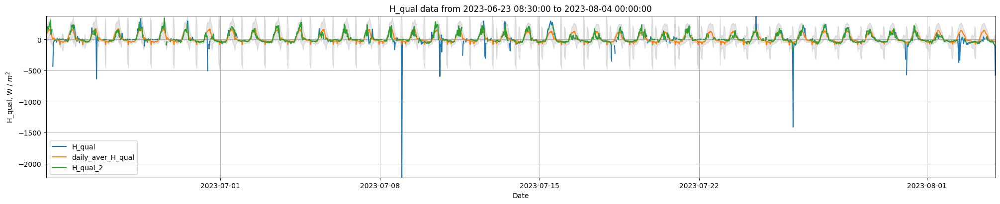

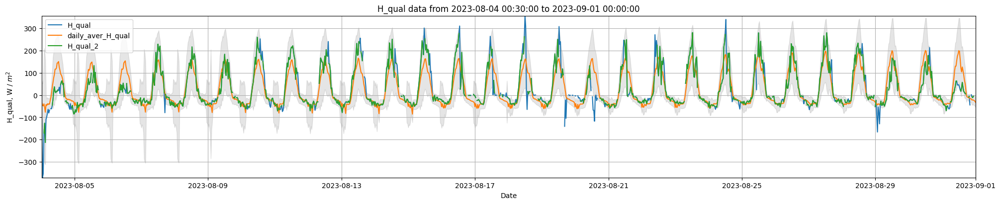

--------------------------

Filling the gaps with size 1-2 values by linear trend:
Number of values filled: 813
--------------------------------

Fill the gaps with daily average trend


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\369506106.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{fig_col} data from {part[ts_col][0]} to {part[ts_col][-1]}')


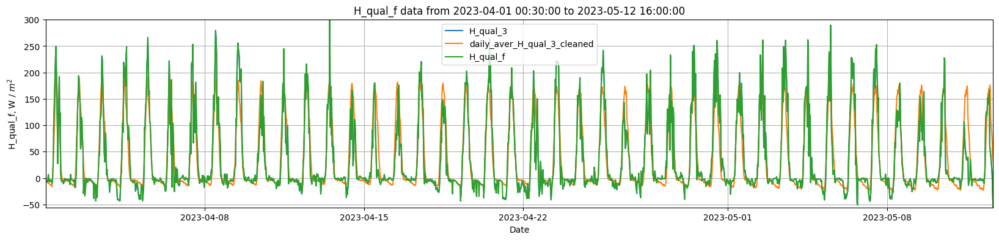

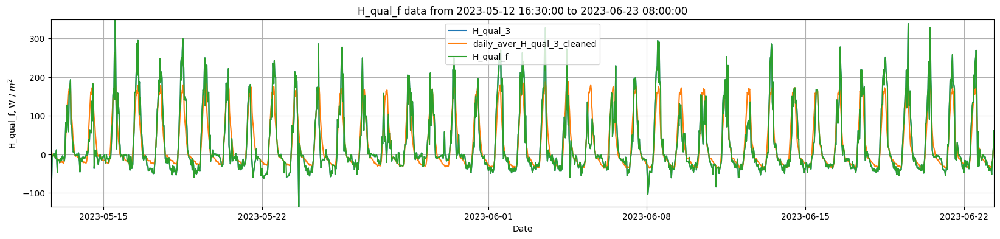

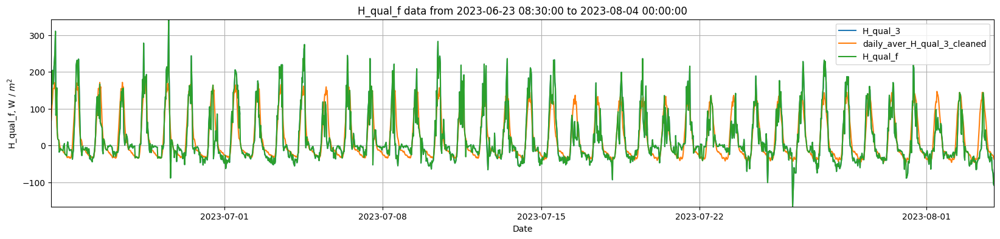

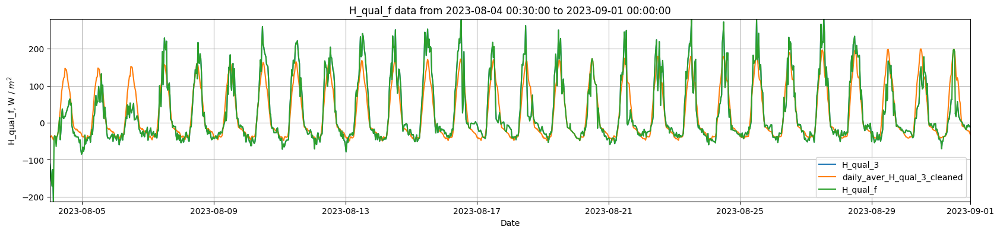

Number of filled values on this step: 565
Number of nan values on this step: 0, 0.0%
----------------------------
----------------------------

------------------
Despike LE_qual:
number of null values: 1323, 18.014705882352942 % 
number of null values: 6021, 81.98529411764706 % 
Column LE_qual has 601 spikes (9.9817306095333%) from total 6021 records


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:52: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} residuals from {part[ts][0]} to {part[ts][-1]}')


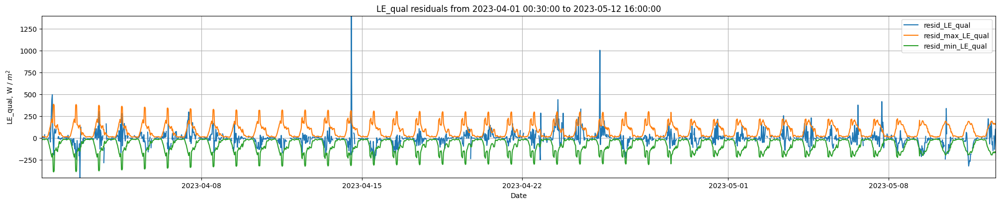

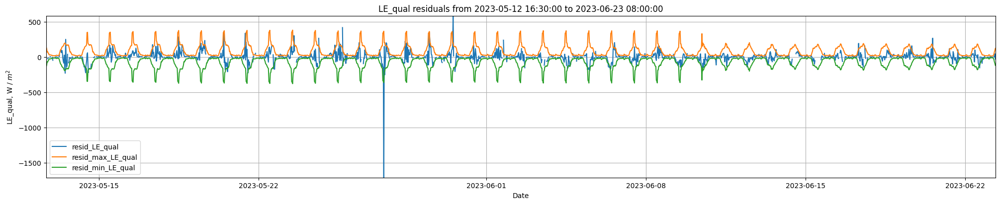

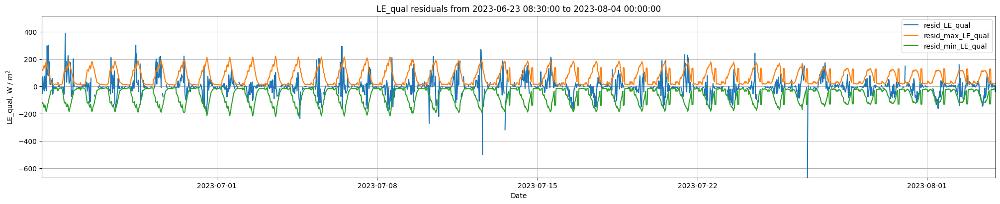

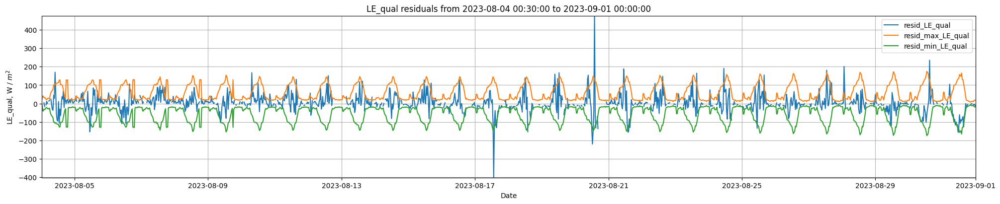


Data LE_qual with discarded outliers:


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\3749859875.py:72: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{col} data from {part[ts][0]} to {part[ts][-1]}')


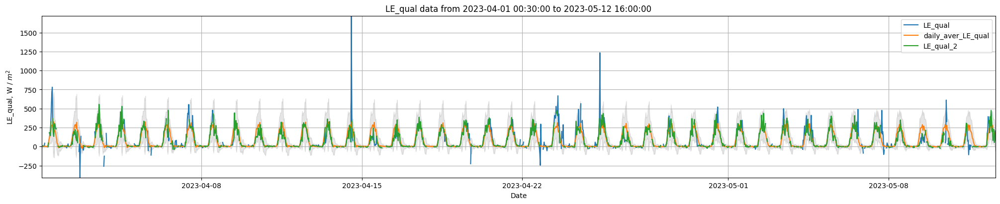

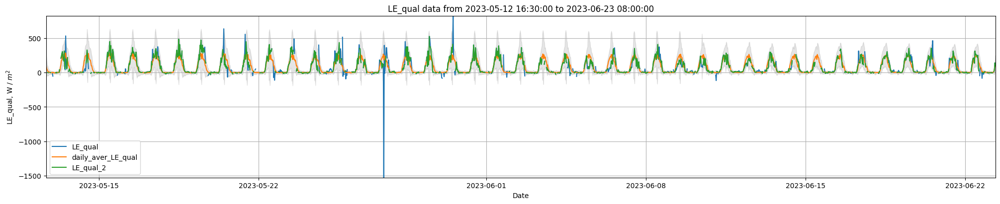

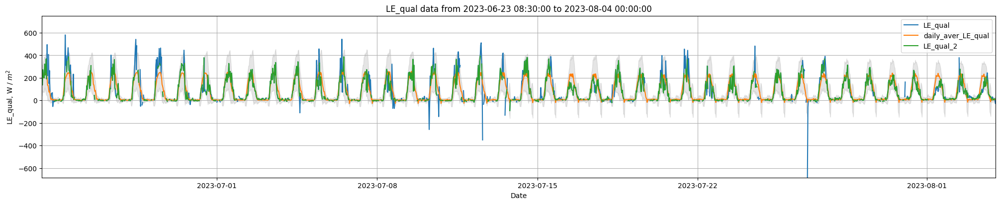

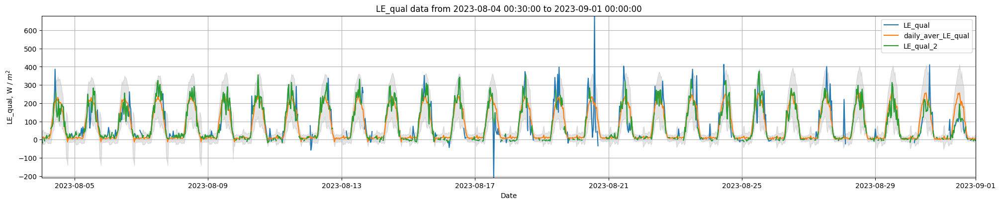

--------------------------

Filling the gaps with size 1-2 values by linear trend:
Number of values filled: 1257
--------------------------------

Fill the gaps with daily average trend


C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\369506106.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{fig_col} data from {part[ts_col][0]} to {part[ts_col][-1]}')


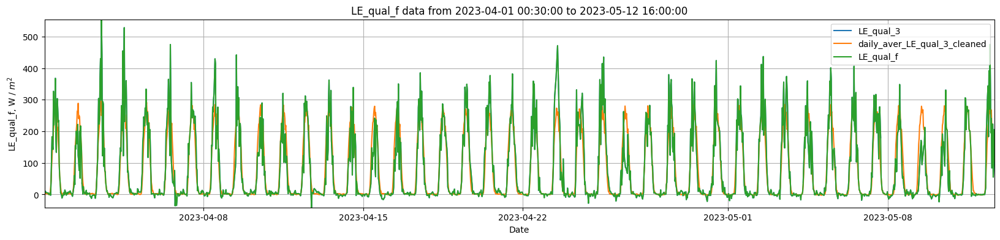

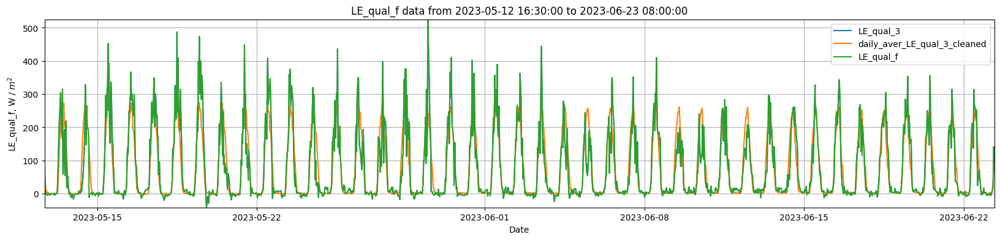

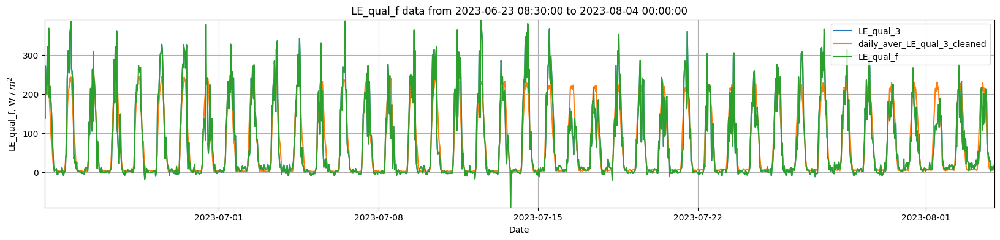

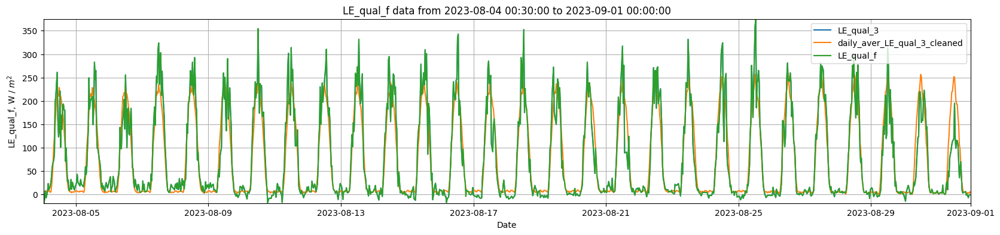

Number of filled values on this step: 667
Number of nan values on this step: 0, 0.0%
----------------------------
----------------------------



In [153]:
make_good_data(all_df, 'key_0')

C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\369506106.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.title(f'{fig_col} data from {part[ts_col][0]} to {part[ts_col][-1]}')


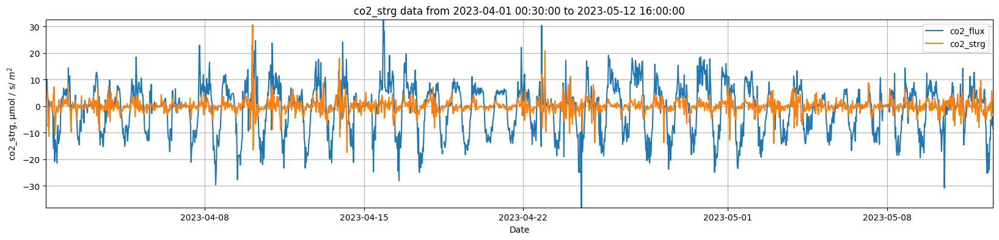

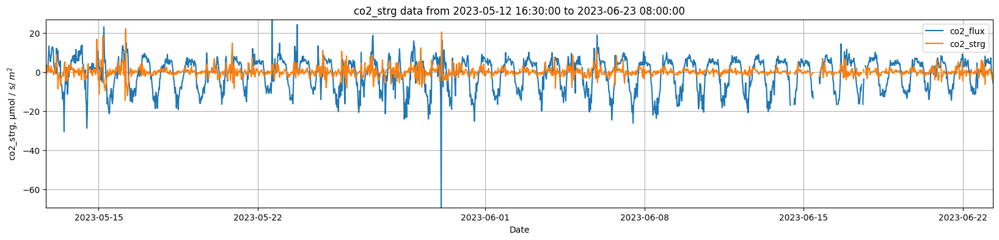

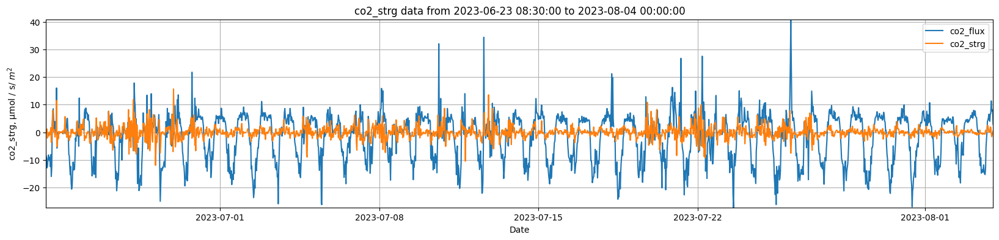

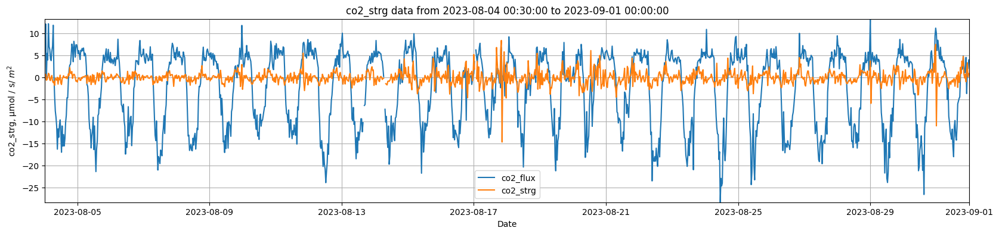

In [154]:
look_at_data(all_df, 'key_0', 'co2_flux', 'co2_strg')

---

# Формирование датасета для загрузки в ReddyProc

In [155]:
fluxes_to_rp = ['NEE_3', 'LE_qual_3', 'H_qual_3']
fluxes_to_rp

['NEE_3', 'LE_qual_3', 'H_qual_3']

In [156]:
reddy_cols = ['key_0', 'date',
 'time',
 'daytime2',
 'DOY'] + fluxes_to_rp + [rg_col, upper_ta, 'TS', upper_rh, 'RH', 'VPD', 'u*']
reddy_cols

['key_0',
 'date',
 'time',
 'daytime2',
 'DOY',
 'NEE_3',
 'LE_qual_3',
 'H_qual_3',
 'RG_1_1_1',
 'TA_2_1_1',
 'TS',
 'RH_2_1_1',
 'RH',
 'VPD',
 'u*']

In [157]:
re_df = all_df[reddy_cols]
re_df

,key_0,date,time,daytime2,DOY,NEE_3,LE_qual_3,H_qual_3,RG_1_1_1,TA_2_1_1,TS,RH_2_1_1,RH,VPD,u*
timestamp,,,,,,,,,,,,,,,
2023-04-01 00:30:00,2023-04-01 00:30:00,2023-04-01,00:30,0,91.020,11.178220,5.582270,NaN,-0.000286,293.869,294.881000,99.3708,99.3708,15.3349,0.198564
2023-04-01 01:00:00,2023-04-01 01:00:00,2023-04-01,01:00,0,91.041,11.178220,5.582270,NaN,-0.000399,293.724,294.863333,99.3341,99.3341,16.0834,0.128945
2023-04-01 01:30:00,2023-04-01 01:30:00,2023-04-01,01:30,0,91.062,12.799520,9.970920,NaN,-0.000520,293.474,294.759000,99.3602,99.3602,15.2167,0.162654
2023-04-01 02:00:00,2023-04-01 02:00:00,2023-04-01,02:00,0,91.083,7.771840,6.037920,NaN,-0.000553,293.256,294.705667,99.3933,99.3933,14.2355,0.148155
2023-04-01 02:30:00,2023-04-01 02:30:00,2023-04-01,02:30,0,91.104,-4.478050,5.599165,-1.633560,-0.000558,293.114,294.683333,99.3114,99.3114,16.0181,0.136272
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-31 22:00:00,2023-08-31 22:00:00,2023-08-31,22:00,0,243.917,3.148869,-2.673600,-11.442400,-0.000475,294.516,295.816667,94.9108,94.9108,129.0510,0.309392
2023-08-31 22:30:00,2023-08-31 22:30:00,2023-08-31,22:30,0,243.937,2.670060,-6.901010,-5.068050,-0.000571,294.224,295.810000,96.5052,96.5052,87.0522,0.171347
2023-08-31 23:00:00,2023-08-31 23:00:00,2023-08-31,23:00,0,243.958,2.191250,-1.545990,-7.884725,-0.000138,294.164,295.772333,96.4106,96.4106,89.0762,0.132334


In [158]:
re_df[(re_df['RH']!=re_df[upper_rh]) & (re_df['RH'].notna())]

,key_0,date,time,daytime2,DOY,NEE_3,LE_qual_3,H_qual_3,RG_1_1_1,TA_2_1_1,TS,RH_2_1_1,RH,VPD,u*
timestamp,,,,,,,,,,,,,,,
2023-06-14 13:00:00,2023-06-14 13:00:00,2023-06-14,13:00,1,165.542,NaN,NaN,NaN,NaN,NaN,NaN,NaN,64.1625,1186.6200,1.457030
2023-06-15 15:30:00,2023-06-15 15:30:00,2023-06-15,15:30,1,166.646,NaN,113.638000,28.8149,NaN,NaN,NaN,NaN,66.9677,1129.7700,0.511918
2023-06-17 13:00:00,2023-06-17 13:00:00,2023-06-17,13:00,1,168.542,-7.315948,115.559000,153.0930,NaN,NaN,NaN,NaN,60.1761,1406.5900,0.633878
2023-06-17 15:30:00,2023-06-17 15:30:00,2023-06-17,15:30,1,168.646,-3.538931,82.329500,-15.1730,NaN,NaN,NaN,NaN,58.8735,1469.2100,0.513670
2023-09-01 00:00:00,2023-09-01 00:00:00,2023-09-01,00:00,0,244.000,4.920683,-0.730139,-10.7014,NaN,NaN,NaN,NaN,98.0248,48.4647,0.184740


In [159]:
re_df.loc[:, upper_rh] = re_df[upper_rh].fillna(re_df['RH'])

In [160]:
re_df[re_df['RH'].isna()].shape, re_df[re_df[upper_rh].isna()].shape

((37, 15), (9, 15))

In [161]:
re_df.loc[:, 'Hour'] = re_df.index.hour + re_df.index.minute / 60

C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\793056488.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  re_df.loc[:, 'Hour'] = re_df.index.hour + re_df.index.minute / 60


In [162]:
re_df[['Hour']]

,Hour
timestamp,
2023-04-01 00:30:00,0.5
2023-04-01 01:00:00,1.0
2023-04-01 01:30:00,1.5
2023-04-01 02:00:00,2.0
2023-04-01 02:30:00,2.5
...,...
2023-08-31 22:00:00,22.0
2023-08-31 22:30:00,22.5
2023-08-31 23:00:00,23.0


In [163]:
(re_df.index[-1] - re_df.index[0]) / pd.Timedelta('30min')

7343.0

In [164]:
re_df[['Hour']].isna().sum()

Hour    0
dtype: int64

In [165]:
re_df.loc[:, 'DoY'] = re_df.index.day_of_year

C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\1006732973.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  re_df.loc[:, 'DoY'] = re_df.index.day_of_year


In [166]:
re_df[['DOY', 'DoY']]

,DOY,DoY
timestamp,,
2023-04-01 00:30:00,91.020,91
2023-04-01 01:00:00,91.041,91
2023-04-01 01:30:00,91.062,91
2023-04-01 02:00:00,91.083,91
2023-04-01 02:30:00,91.104,91
...,...,...
2023-08-31 22:00:00,243.917,243
2023-08-31 22:30:00,243.937,243
2023-08-31 23:00:00,243.958,243


In [167]:
re_df.loc[:, []]

""
timestamp
2023-04-01 00:30:00
2023-04-01 01:00:00
2023-04-01 01:30:00
2023-04-01 02:00:00
2023-04-01 02:30:00
...
2023-08-31 22:00:00
2023-08-31 22:30:00
2023-08-31 23:00:00


In [168]:
re_df.loc[:, 'Year'] = re_df.index.year

C:\Users\Natalya\AppData\Local\Temp\ipykernel_14908\2958180638.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  re_df.loc[:, 'Year'] = re_df.index.year


In [169]:
final_cols = 'Year	DoY	Hour	NEE	LE	H	Rg	Tair	Tsoil	rH	VPD	Ustar'.split('\t')
final_cols

['Year',
 'DoY',
 'Hour',
 'NEE',
 'LE',
 'H',
 'Rg',
 'Tair',
 'Tsoil',
 'rH',
 'VPD',
 'Ustar']

In [170]:
list(re_df.columns)

['key_0',
 'date',
 'time',
 'daytime2',
 'DOY',
 'NEE_3',
 'LE_qual_3',
 'H_qual_3',
 'RG_1_1_1',
 'TA_2_1_1',
 'TS',
 'RH_2_1_1',
 'RH',
 'VPD',
 'u*',
 'Hour',
 'DoY',
 'Year']

In [171]:
reddy = re_df[['Year', 'DoY', 'Hour', 'NEE_3', 'LE_qual_3', 'H_qual_3', rg_col, upper_ta, 'TS', upper_rh, 'VPD', 'u*']]
reddy.reset_index(inplace=True, drop=True)
reddy

,Year,DoY,Hour,NEE_3,LE_qual_3,H_qual_3,RG_1_1_1,TA_2_1_1,TS,RH_2_1_1,VPD,u*
0,2023,91,0.5,11.178220,5.582270,NaN,-0.000286,293.869,294.881000,99.3708,15.3349,0.198564
1,2023,91,1.0,11.178220,5.582270,NaN,-0.000399,293.724,294.863333,99.3341,16.0834,0.128945
2,2023,91,1.5,12.799520,9.970920,NaN,-0.000520,293.474,294.759000,99.3602,15.2167,0.162654
3,2023,91,2.0,7.771840,6.037920,NaN,-0.000553,293.256,294.705667,99.3933,14.2355,0.148155
4,2023,91,2.5,-4.478050,5.599165,-1.633560,-0.000558,293.114,294.683333,99.3114,16.0181,0.136272
...,...,...,...,...,...,...,...,...,...,...,...,...
7339,2023,243,22.0,3.148869,-2.673600,-11.442400,-0.000475,294.516,295.816667,94.9108,129.0510,0.309392
7340,2023,243,22.5,2.670060,-6.901010,-5.068050,-0.000571,294.224,295.810000,96.5052,87.0522,0.171347
7341,2023,243,23.0,2.191250,-1.545990,-7.884725,-0.000138,294.164,295.772333,96.4106,89.0762,0.132334
7342,2023,243,23.5,4.920683,-0.730139,-10.701400,-0.000070,294.159,295.703333,97.1088,71.7283,0.159244


In [172]:
reddy.columns = final_cols
reddy.loc[:, ['Tair', 'Tsoil']] = reddy[['Tair', 'Tsoil']] - 273.15
reddy.loc[:, reddy.columns[3:]] = reddy[reddy.columns[3:]].round(2)


In [173]:
reddy.loc[reddy['rH'] > 100, 'rH'] = 100
reddy.loc[:, 'VPD'] = (reddy['VPD'] / 100).round(2)
reddy.loc[reddy['VPD'] <= 0, 'VPD'] = 0
reddy.loc[reddy['Rg'] <= 0, 'Rg'] = 0
reddy

,Year,DoY,Hour,NEE,LE,H,Rg,Tair,Tsoil,rH,VPD,Ustar
0,2023,91,0.5,11.18,5.58,NaN,0.0,20.72,21.73,99.37,0.15,0.20
1,2023,91,1.0,11.18,5.58,NaN,0.0,20.57,21.71,99.33,0.16,0.13
2,2023,91,1.5,12.80,9.97,NaN,0.0,20.32,21.61,99.36,0.15,0.16
3,2023,91,2.0,7.77,6.04,NaN,0.0,20.11,21.56,99.39,0.14,0.15
4,2023,91,2.5,-4.48,5.60,-1.63,0.0,19.96,21.53,99.31,0.16,0.14
...,...,...,...,...,...,...,...,...,...,...,...,...
7339,2023,243,22.0,3.15,-2.67,-11.44,0.0,21.37,22.67,94.91,1.29,0.31
7340,2023,243,22.5,2.67,-6.90,-5.07,0.0,21.07,22.66,96.51,0.87,0.17
7341,2023,243,23.0,2.19,-1.55,-7.88,0.0,21.01,22.62,96.41,0.89,0.13
7342,2023,243,23.5,4.92,-0.73,-10.70,0.0,21.01,22.55,97.11,0.72,0.16


In [174]:
final_units = '-	-	-	umolm-2s-1	Wm-2	Wm-2	Wm-2	degC	degC	%	hPa	ms-1'.split('\t')
reddy_u = pd.DataFrame({ x:[y] for x, y in zip( reddy.columns, final_units)})
reddy_u

,Year,DoY,Hour,NEE,LE,H,Rg,Tair,Tsoil,rH,VPD,Ustar
0,-,-,-,umolm-2s-1,Wm-2,Wm-2,Wm-2,degC,degC,%,hPa,ms-1


In [175]:
reddy = pd.concat([reddy_u, reddy])
reddy

,Year,DoY,Hour,NEE,LE,H,Rg,Tair,Tsoil,rH,VPD,Ustar
0,-,-,-,umolm-2s-1,Wm-2,Wm-2,Wm-2,degC,degC,%,hPa,ms-1
0,2023,91,0.5,11.18,5.58,NaN,0.0,20.72,21.73,99.37,0.15,0.2
1,2023,91,1.0,11.18,5.58,NaN,0.0,20.57,21.71,99.33,0.16,0.13
2,2023,91,1.5,12.8,9.97,NaN,0.0,20.32,21.61,99.36,0.15,0.16
3,2023,91,2.0,7.77,6.04,NaN,0.0,20.11,21.56,99.39,0.14,0.15
...,...,...,...,...,...,...,...,...,...,...,...,...
7339,2023,243,22.0,3.15,-2.67,-11.44,0.0,21.37,22.67,94.91,1.29,0.31
7340,2023,243,22.5,2.67,-6.9,-5.07,0.0,21.07,22.66,96.51,0.87,0.17
7341,2023,243,23.0,2.19,-1.55,-7.88,0.0,21.01,22.62,96.41,0.89,0.13
7342,2023,243,23.5,4.92,-0.73,-10.7,0.0,21.01,22.55,97.11,0.72,0.16


In [176]:
reddy = reddy.fillna(-9999)
reddy

,Year,DoY,Hour,NEE,LE,H,Rg,Tair,Tsoil,rH,VPD,Ustar
0,-,-,-,umolm-2s-1,Wm-2,Wm-2,Wm-2,degC,degC,%,hPa,ms-1
0,2023,91,0.5,11.18,5.58,-9999,0.0,20.72,21.73,99.37,0.15,0.2
1,2023,91,1.0,11.18,5.58,-9999,0.0,20.57,21.71,99.33,0.16,0.13
2,2023,91,1.5,12.8,9.97,-9999,0.0,20.32,21.61,99.36,0.15,0.16
3,2023,91,2.0,7.77,6.04,-9999,0.0,20.11,21.56,99.39,0.14,0.15
...,...,...,...,...,...,...,...,...,...,...,...,...
7339,2023,243,22.0,3.15,-2.67,-11.44,0.0,21.37,22.67,94.91,1.29,0.31
7340,2023,243,22.5,2.67,-6.9,-5.07,0.0,21.07,22.66,96.51,0.87,0.17
7341,2023,243,23.0,2.19,-1.55,-7.88,0.0,21.01,22.62,96.41,0.89,0.13
7342,2023,243,23.5,4.92,-0.73,-10.7,0.0,21.01,22.55,97.11,0.72,0.16


In [177]:
now = time.strftime('%Y_%m_%d_%H_%M_%S', time.localtime())
filename = f'KCR_reddy_{now}.txt'
reddy.to_csv(filename, sep = '\t', index=False)

---

---